In [1]:
import numpy as np
import sys
from PIL import Image, ImageEnhance
import matplotlib.patches as patches
import matplotlib.pyplot as plt 
import time



In [2]:
###Import darknet.py from darknet/examples, wherever you installed yolov3 darknet
from darknet import *

In [3]:
datacfg = 'cfg/sdss_nuevo.data'
cfgfile = 'cfg/sdss_nuevo.cfg'

weightfile = 'sdss_nuevo_14000.weights' 
filename = 'galaxies.jpg' ##try with galaxies2.jpg and galaxies3.jpg
                          ##The three images were downloaded from google images

thresh = 0.1  #detection probability threshold
hier_thresh = 0.5



In [4]:
net = load_net(cfgfile, weightfile, 0)
meta = load_meta(datacfg)
outputsA = detect(net, meta, filename,thresh=thresh)
print outputsA

[('Spiral', 0.8007534146308899, (190.52122497558594, 1307.091064453125, 54.7099723815918, 49.264286041259766)), ('Spiral', 0.7829649448394775, (269.75994873046875, 948.6243896484375, 96.37926483154297, 92.21536254882812)), ('Spiral', 0.766826331615448, (719.43212890625, 1771.410400390625, 59.72392654418945, 49.68794631958008)), ('Spiral', 0.7460400462150574, (1130.9141845703125, 847.290283203125, 53.638816833496094, 50.09961700439453)), ('Elliptical ', 0.7253156900405884, (1987.4061279296875, 922.8817138671875, 33.90676498413086, 29.950817108154297)), ('Edge-on', 0.6678253412246704, (1825.0496826171875, 1966.2115478515625, 32.544517517089844, 28.877792358398438)), ('Elliptical ', 0.6487071514129639, (1122.06640625, 1316.32763671875, 38.90225601196289, 32.531009674072266)), ('Spiral', 0.6193338632583618, (201.1652069091797, 203.6214599609375, 44.93289566040039, 34.51426315307617)), ('Elliptical ', 0.5348069071769714, (2303.8115234375, 1166.86328125, 63.115806579589844, 56.3651237487793)

In [5]:
centers = []
outputs = []
for output in outputsA:
    check= True
    center_output = np.array([output[2][0],output[2][1],output[2][2],output[2][3]])
##Yolo3 tends to detect galaxies more than once and in different sized detection boxes

    for center in centers:
        if np.linalg.norm(center_output - center)<15:
            check = False
    if check:
        centers.append(center_output)
        outputs.append(output)

        
print '%d galaxies detected'%len(outputs)
    
asd=len(outputs)           

167 galaxies detected


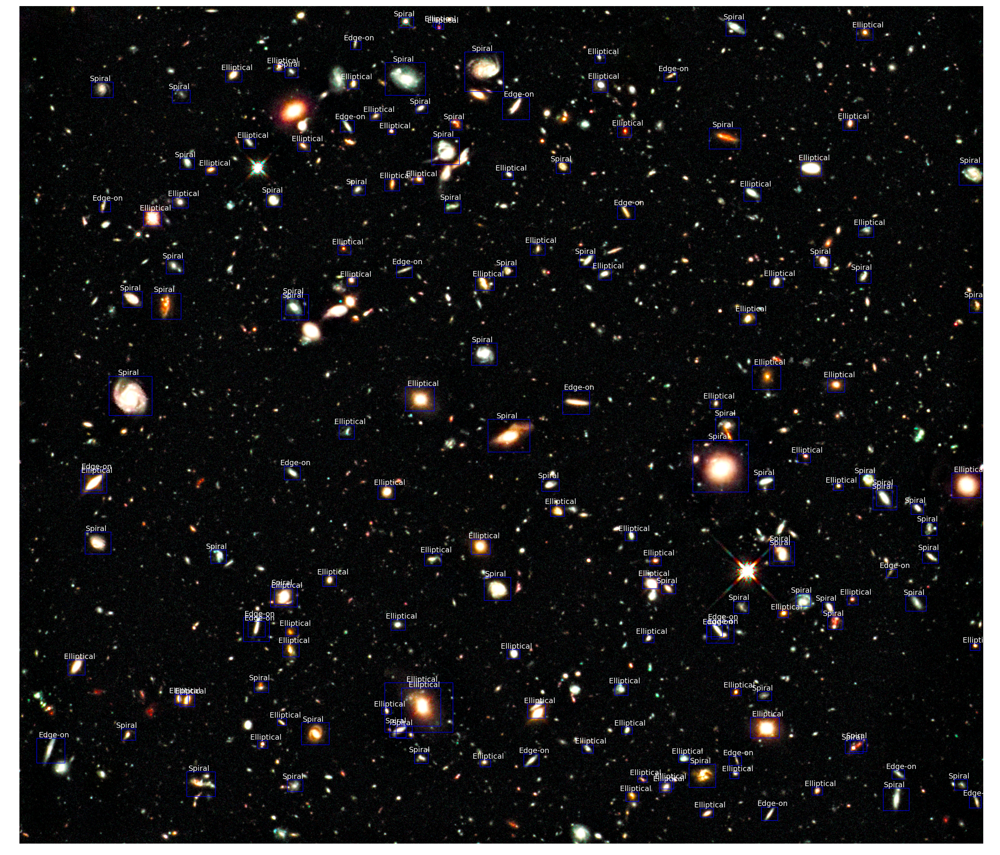

In [6]:


#plot image and detections
img = Image.open(filename)
contrast = ImageEnhance.Contrast(img)
img2 = contrast.enhance(1.5) # just for visualzation 
fig,ax = plt.subplots(figsize=(30,22))
plt.axis('off')
plt.tight_layout(pad=0)
plt.imshow(img2)
ax.set_aspect('equal')
for output in outputs:
    
        cx=output[2][0]
        cy=output[2][1]
        w=output[2][2]
        h=output[2][3]
        
        r=cx+w/2
        l=cx-w/2
        t=cy-h/2
        b=cy+h/2
        rect = patches.Rectangle((l-4,t-3),r-l+8,b-t+4,linewidth=1,edgecolor='b',facecolor='none')      
        ax.add_patch(rect)
        ax.annotate(output[0],((l+r)/2-30,t-5),color='w',fontsize=14)
plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0) 
#plt.savefig('../writable/%s_thresh_%4.2f_weights_%s_detections_%4d.jpg'%(filename[3:-4],thresh,weightfile[14:-8],asd),dpi=180)
plt.savefig('../galaxias_yolo3.jpg',dpi=180)
plt.show()


In [7]:
%%javascript
IPython.notebook.kernel.restart();

<IPython.core.display.Javascript object>